In [1]:

!pip install tensorflow

In [2]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

I0000 00:00:1777543264.155367    4459 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1777543264.366012    4459 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1777543265.329528    4459 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [3]:
# Path to your single dataset folder (should have subfolders for each class)
data_dir = '/teamspace/studios/this_studio/Bottle_Gourd'  # e.g., 'vegetable_dataset/'

# Parameters
BATCH_SIZE = 128
IMG_SIZE = (224, 224)  # DenseNet121 default input size
NUM_CLASSES = 8
EPOCHS = 1
VAL_SPLIT = 0.2  # 20% for validation
TEST_SPLIT = 0.1  # 10% for testing

In [4]:
# Step 2: Load and preprocess dataset with progress bar
def load_dataset(data_dir):
    images = []
    labels = []

    for class_idx, class_name in enumerate(CLASS_NAMES):
        class_dir = os.path.join(data_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"Warning: Directory {class_dir} not found!")
            continue

        print(f"Loading {class_name} images...")
        for img_file in tqdm(os.listdir(class_dir)):
            img_path = os.path.join(class_dir, img_file)
            try:
                with Image.open(img_path) as img:
                    img = img.convert('RGB')  # Ensure RGB format
                    img = img.resize(IMAGE_SIZE)
                    img_array = np.array(img) / 255.0
                    if img_array.shape == (*IMAGE_SIZE, 3):
                        images.append(img_array)
                        labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    return np.array(images), np.array(labels)

In [5]:
import os
import numpy as np
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from collections import Counter
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator

IMG_SIZE = (224, 224)
TARGET_PER_CLASS = 1000  # 3x from 500 original images

# 🏷 Class names
class_names = sorted(os.listdir(data_dir))
NUM_CLASSES = len(class_names)
print("Classes:", class_names)

# 🎛 Data Augmentation Setup
aug_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# 🖼 Load images and apply augmentation
all_images = []
all_labels = []

for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(data_dir, class_name)
    img_names = os.listdir(class_path)
    img_paths = [os.path.join(class_path, img) for img in img_names]

    # Load original images
    original_images = []
    for img_path in img_paths:
        img = load_img(img_path, target_size=IMG_SIZE)
        img_array = img_to_array(img)
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)
        original_images.append(img_array)

    # Add original images
    all_images.extend(original_images)
    all_labels.extend([class_idx] * len(original_images))

    # Number of augmented images to generate
    num_to_generate = TARGET_PER_CLASS - len(original_images)
    print(f"{class_name}: Generating {num_to_generate} augmented images")

    i = 0
    while i < num_to_generate:
        img = random.choice(original_images)
        img = np.expand_dims(img, axis=0)
        for batch in aug_gen.flow(img, batch_size=1):
            all_images.append(batch[0])
            all_labels.append(class_idx)
            i += 1
            if i >= num_to_generate:
                break

# 🔀 Final dataset
X = np.array(all_images)
y = np.array(all_labels)
print(f"\n✅ Total images after augmentation: {X.shape[0]}")
print("Class distribution:", Counter(y))

# 🔀 Split: 15% test, then 15% val, rest train
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, stratify=y_temp, random_state=42)

# 📦 TF Datasets
def create_dataset(X, y):
    return tf.data.Dataset.from_tensor_slices((X, tf.one_hot(y, depth=NUM_CLASSES)))

train_ds = create_dataset(X_train, y_train).shuffle(1000).batch(BATCH_SIZE)
val_ds = create_dataset(X_val, y_val).batch(BATCH_SIZE)
test_ds = create_dataset(X_test, y_test).batch(BATCH_SIZE)

# 🧾 Summary
print("\n✅ Final dataset shapes:")
print("Train:", X_train.shape, " | ", Counter(y_train))
print("Val  :", X_val.shape, " | ", Counter(y_val))
print("Test :", X_test.shape, " | ", Counter(y_test))

Classes: ['Alternaria_Leaf_Blight', 'Angular_Leaf_spot', 'Anthracnose', 'Downy_Mildew', 'Early_Alternaria_Leaf_Blight', 'Fungal_Damage_Leaf', 'Healthy', 'Mosaic_Virus']
Alternaria_Leaf_Blight: Generating 821 augmented images


Angular_Leaf_spot: Generating 986 augmented images
Anthracnose: Generating 502 augmented images
Downy_Mildew: Generating 954 augmented images
Early_Alternaria_Leaf_Blight: Generating 955 augmented images
Fungal_Damage_Leaf: Generating 969 augmented images
Healthy: Generating 945 augmented images
Mosaic_Virus: Generating 749 augmented images

✅ Total images after augmentation: 8000
Class distribution: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000})


W0000 00:00:1777543331.343560    4459 gpu_device.cc:2365] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...



✅ Final dataset shapes:
Train: (5599, 224, 224, 3)  |  Counter({5: 700, 7: 700, 4: 700, 1: 700, 2: 700, 3: 700, 0: 700, 6: 699})
Val  : (1201, 224, 224, 3)  |  Counter({6: 151, 1: 150, 7: 150, 0: 150, 5: 150, 4: 150, 3: 150, 2: 150})
Test : (1200, 224, 224, 3)  |  Counter({7: 150, 5: 150, 0: 150, 2: 150, 1: 150, 3: 150, 4: 150, 6: 150})


In [6]:
# hybrid_fusion_densenet201_transformer_gnn.py
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import DenseNet201

# ----------------------------
# Helper layers / blocks
# ----------------------------
class AddPositionEmbs(layers.Layer):
    """Add (learnable) positional embeddings to a sequence."""
    def __init__(self, seq_len, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.seq_len = seq_len
        self.embed_dim = embed_dim
        self.pos_emb = self.add_weight(
            shape=(1, seq_len, embed_dim),
            initializer="random_normal",
            trainable=True,
            name="pos_emb"
        )

    def call(self, x):
        return x + self.pos_emb


def transformer_encoder_block(x, num_heads=4, mlp_dim=512, dropout=0.1, name=None):
    """Single Transformer encoder block: LN -> MHA -> Add -> LN -> MLP -> Add"""
    input_dim = int(x.shape[-1])
    # LayerNorm + MHA
    y = layers.LayerNormalization(epsilon=1e-6, name=(None if name is None else name + "_ln1"))(x)
    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=input_dim//num_heads,
                                     name=(None if name is None else name + "_mha"))(y, y)
    attn = layers.Dropout(dropout)(attn)
    x = layers.Add()([x, attn])

    # LayerNorm + MLP
    y = layers.LayerNormalization(epsilon=1e-6, name=(None if name is None else name + "_ln2"))(x)
    y = layers.Dense(mlp_dim, activation="gelu", name=(None if name is None else name + "_mlp_fc1"))(y)
    y = layers.Dropout(dropout)(y)
    y = layers.Dense(input_dim, name=(None if name is None else name + "_mlp_fc2"))(y)
    y = layers.Dropout(dropout)(y)
    out = layers.Add()([x, y])
    return out


# ----------------------------
# Lightweight Graph Neural Network Block
# ----------------------------
def gnn_block(x, num_heads=4, dropout=0.1, name=None):
    """
    Simple Graph Attention Network (GAT)-style block:
    - LayerNorm
    - MultiHeadAttention (as Graph Attention)
    - Residual + Dropout
    - Feedforward MLP
    """
    input_dim = int(x.shape[-1])
    y = layers.LayerNormalization(epsilon=1e-6, name=(None if name is None else name + "_ln1"))(x)
    attn = layers.MultiHeadAttention(
        num_heads=num_heads,
        key_dim=input_dim // num_heads,
        name=(None if name is None else name + "_gat_mha")
    )(y, y)
    attn = layers.Dropout(dropout)(attn)
    x = layers.Add()([x, attn])  # Residual

    y = layers.LayerNormalization(epsilon=1e-6, name=(None if name is None else name + "_ln2"))(x)
    y = layers.Dense(input_dim * 2, activation="gelu", name=(None if name is None else name + "_ff1"))(y)
    y = layers.Dropout(dropout)(y)
    y = layers.Dense(input_dim, name=(None if name is None else name + "_ff2"))(y)
    out = layers.Add()([x, y])
    return out


# ----------------------------
# Build Hybrid Model (DenseNet201 + Transformer + GNN)
# ----------------------------
def build_hybrid_model(
    input_shape=(224, 224, 3),
    num_classes=8,
    transformer_embed_dim=768,
    transformer_depth=4,
    transformer_num_heads=8,
    transformer_mlp_dim=2048,
    transformer_dropout=0.1,
    cnn_proj_dim=768,
    gnn_layers=2,
    gnn_heads=4,
):
    # 1) DenseNet201 backbone
    backbone = DenseNet201(include_top=False, weights="imagenet", input_shape=input_shape)
    backbone.trainable = True

    cnn_feats = backbone.output  # (B, 7, 7, 1920)

    # 2) Multi-scale CNN feature extraction
    high = layers.Conv2D(cnn_proj_dim, kernel_size=1, padding="same", name="proj_high")(cnn_feats)
    high_pool = layers.GlobalAveragePooling2D(name="gap_high")(high)

    mid = layers.AveragePooling2D(pool_size=2, padding="same")(cnn_feats)
    mid = layers.Conv2D(cnn_proj_dim, kernel_size=1, padding="same", name="proj_mid")(mid)
    mid_pool = layers.GlobalAveragePooling2D(name="gap_mid")(mid)

    low = layers.AveragePooling2D(pool_size=4, padding="same")(cnn_feats)
    low = layers.Conv2D(cnn_proj_dim, kernel_size=1, padding="same", name="proj_low")(low)
    low_pool = layers.GlobalAveragePooling2D(name="gap_low")(low)

    cnn_concat = layers.Concatenate(name="cnn_multi_scale_concat")([high_pool, mid_pool, low_pool])
    cnn_emb = layers.Dense(transformer_embed_dim, activation="gelu", name="cnn_emb_fc")(cnn_concat)

    # 3) Transformer sequence from high-level features
    H, W, C = int(high.shape[1]), int(high.shape[2]), int(high.shape[3])
    seq_len = H * W
    x = layers.Reshape((seq_len, C), name="seq_from_high")(high)
    if C != transformer_embed_dim:
        x = layers.Dense(transformer_embed_dim, name="proj_token_dim")(x)

    # CLS token
    cls_token = tf.Variable(initial_value=tf.zeros(shape=(1, 1, transformer_embed_dim)), trainable=True, name="cls_token")
    def add_cls_token(t):
        b = tf.shape(t)[0]
        cls = tf.tile(cls_token, (b, 1, 1))
        return tf.concat([cls, t], axis=1)

    x = layers.Lambda(add_cls_token, name="add_cls_token")(x)
    x = AddPositionEmbs(seq_len + 1, transformer_embed_dim, name="pos_embs")(x)

    # 4) Transformer Encoder Stack
    for i in range(transformer_depth):
        x = transformer_encoder_block(
            x,
            num_heads=transformer_num_heads,
            mlp_dim=transformer_mlp_dim,
            dropout=transformer_dropout,
            name=f"trans_enc_{i}"
        )

    # 5) Graph Neural Network (GNN) stack on top of transformer sequence
    for i in range(gnn_layers):
        x = gnn_block(x, num_heads=gnn_heads, dropout=transformer_dropout, name=f"gnn_layer_{i}")

    # CLS representation
    cls_rep = layers.Lambda(lambda t: t[:, 0, :], name="get_cls")(x)

    # 6) Fusion: attention-based fusion between CNN and Transformer-GNN
    cnn_query = layers.Reshape((1, transformer_embed_dim), name="cnn_query_reshape")(cnn_emb)
    transformer_seq = x

    attn_fused = layers.MultiHeadAttention(
        num_heads=transformer_num_heads,
        key_dim=transformer_embed_dim // transformer_num_heads,
        name="fusion_mha"
    )(cnn_query, transformer_seq)
    attn_fused = layers.Flatten()(attn_fused)

    combined = layers.Concatenate(name="fusion_concat")([attn_fused, cls_rep, cnn_emb])
    combined = layers.LayerNormalization(name="fusion_ln")(combined)
    combined = layers.Dense(transformer_embed_dim, activation="gelu", name="fusion_fc")(combined)
    combined = layers.Dropout(0.2)(combined)

    # 7) Classification Head
    logits = layers.Dense(num_classes, name="logits")(combined)
    outputs = layers.Activation("softmax", dtype="float32", name="preds")(logits)

    model = Model(inputs=backbone.input, outputs=outputs, name="DenseNet201_Transformer_GNN_Fusion")
    return model


# ----------------------------
# Example: create and compile
# ----------------------------
if __name__ == "__main__":
    model = build_hybrid_model(
        input_shape=(224, 224, 3),
        num_classes=8,
        transformer_embed_dim=768,
        transformer_depth=4,
        transformer_num_heads=8,
        transformer_mlp_dim=2048,
        transformer_dropout=0.1,
        cnn_proj_dim=768,
        gnn_layers=2,
        gnn_heads=4
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=["accuracy"]
    )

    model.summary()


Model: "DenseNet201_Transformer_GNN_Fusion"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 60,209,992 (229.68 MB)

 Trainable params: 59,980,936 (228.81 MB)

 Non-trainable params: 229,056 (894.75 KB)

In [7]:
!pip install visualkeras

In [8]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# ✅ Define model name manually
model_name = "Hybrid"

# ✅ Callbacks (using correct model name)
checkpoint = ModelCheckpoint(
    f"{model_name}.h5",
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-4
)

# ✅ Train
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,                  # EPOCHS must be integer
    callbacks=[checkpoint, early_stop, reduce_lr]
    
)

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7272 - loss: 1.4171

44/44 ━━━━━━━━━━━━━━━━━━━━ 304s 6s/step - accuracy: 0.8782 - loss: 0.8988 - val_accuracy: 0.9217 - val_loss: 0.7049 - learning_rate: 1.0000e-04


In [ ]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


10/10 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step
Classification Report:
                              precision    recall  f1-score   support

      Alternaria_Leaf_Blight       0.77      0.91      0.84       150
           Angular_Leaf_spot       1.00      0.99      0.99       150
                 Anthracnose       0.94      0.60      0.73       150
                Downy_Mildew       1.00      0.98      0.99       150
Early_Alternaria_Leaf_Blight       0.99      0.97      0.98       150
          Fungal_Damage_Leaf       1.00      0.97      0.98       150
                     Healthy       0.83      1.00      0.91       150
                Mosaic_Virus       0.87      0.93      0.90       150

                    accuracy                           0.92      1200
                   macro avg       0.93      0.92      0.91      1200
                weighted avg       0.93      0.92      0.91      1200

Confusion matrix, without normalization


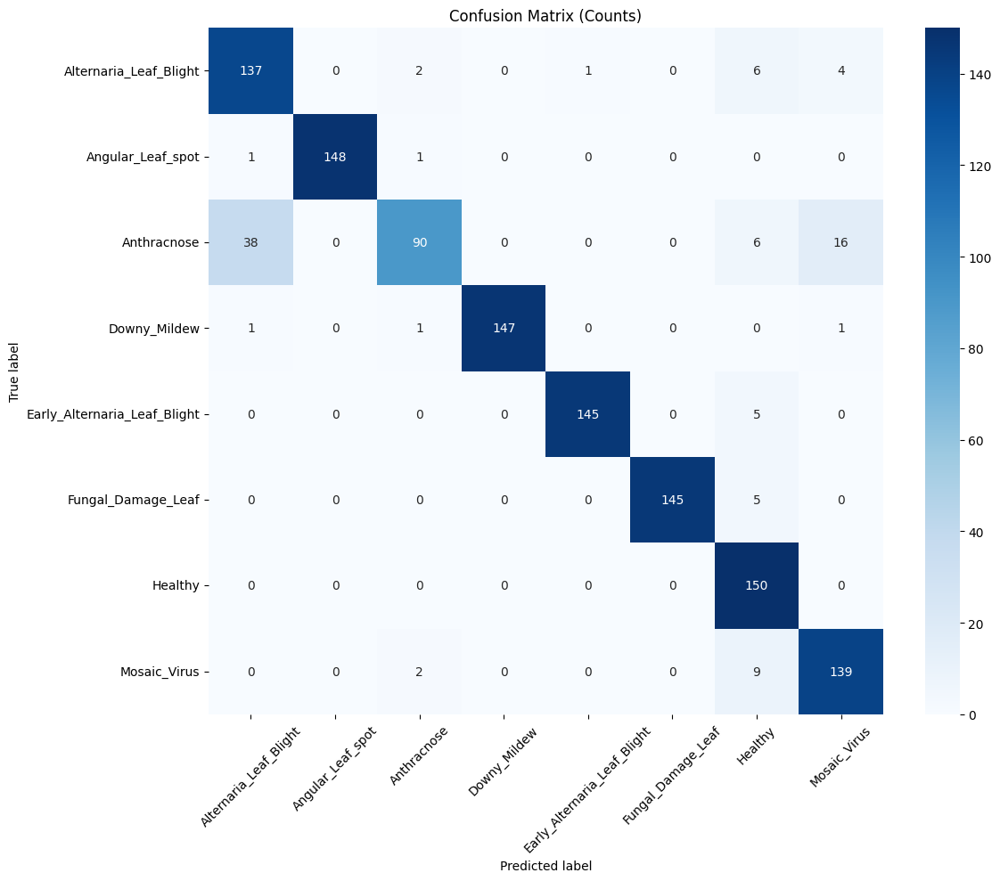

Normalized confusion matrix


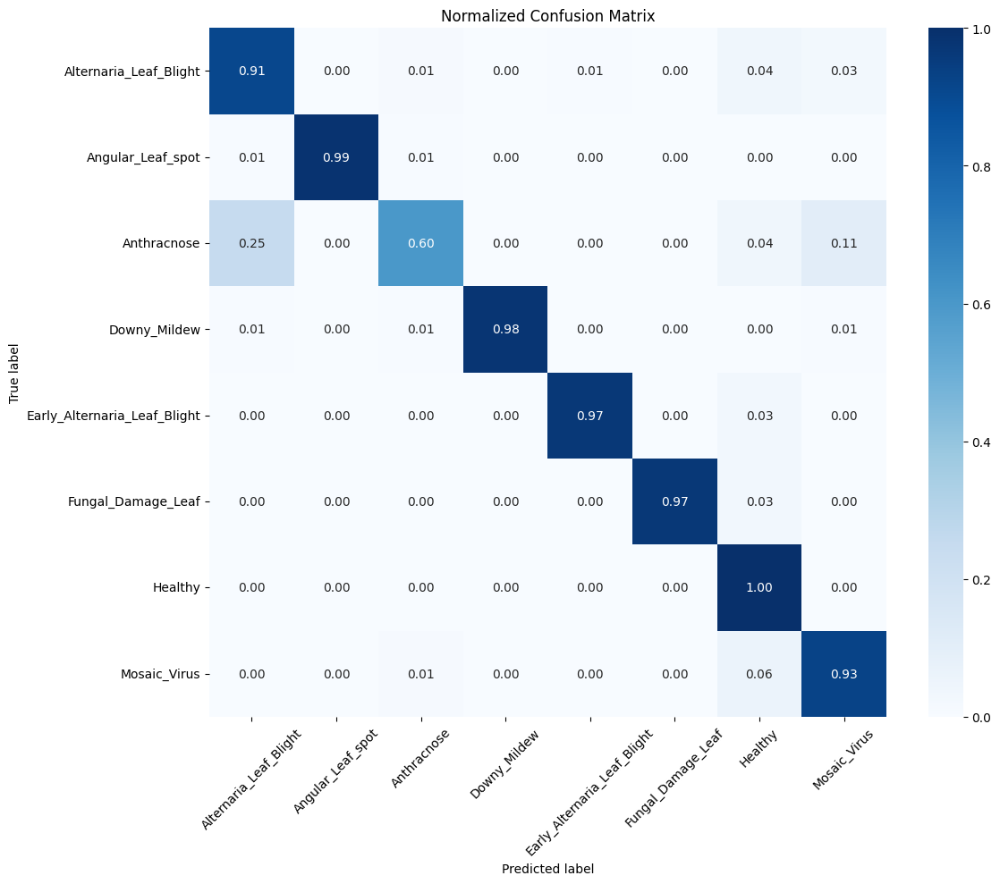

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# 1. Get predictions and true labels from test set
y_pred = model.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class indices
y_true = np.concatenate([np.argmax(y.numpy(), axis=1) for _, y in test_ds], axis=0)

# 2. Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

# 3. Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    cm = confusion_matrix(y_true, y_pred)
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd',
                cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_true, y_pred_classes, classes=class_names,
                      title='Confusion Matrix (Counts)')

# Plot normalized confusion matrix
plot_confusion_matrix(y_true, y_pred_classes, classes=class_names, normalize=True,
                      title='Normalized Confusion Matrix')

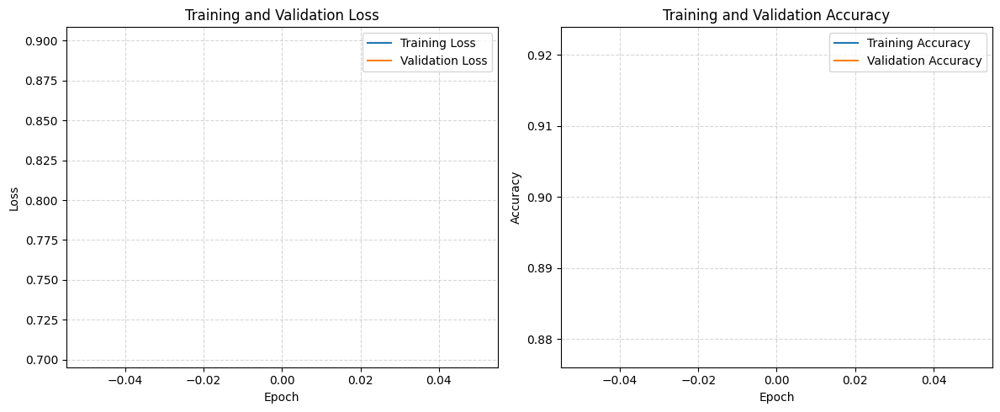


Best Validation Loss: 0.7049 at epoch 1
Corresponding Training Loss: 0.8988
Validation Accuracy at Best Epoch: 0.9217


In [ ]:
import matplotlib.pyplot as plt

# Get training history from model.fit()
history = model.history.history

# Create figure with two subplots
plt.figure(figsize=(12, 5))

# 1. Plot Loss Curves
plt.subplot(1, 2, 1)
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# 2. Plot Accuracy Curves
plt.subplot(1, 2, 2)
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

# Optional: Print best validation accuracy
best_val_epoch = np.argmin(history['val_loss'])
print(f"\nBest Validation Loss: {min(history['val_loss']):.4f} at epoch {best_val_epoch + 1}")
print(f"Corresponding Training Loss: {history['loss'][best_val_epoch]:.4f}")
print(f"Validation Accuracy at Best Epoch: {history['val_accuracy'][best_val_epoch]:.4f}")

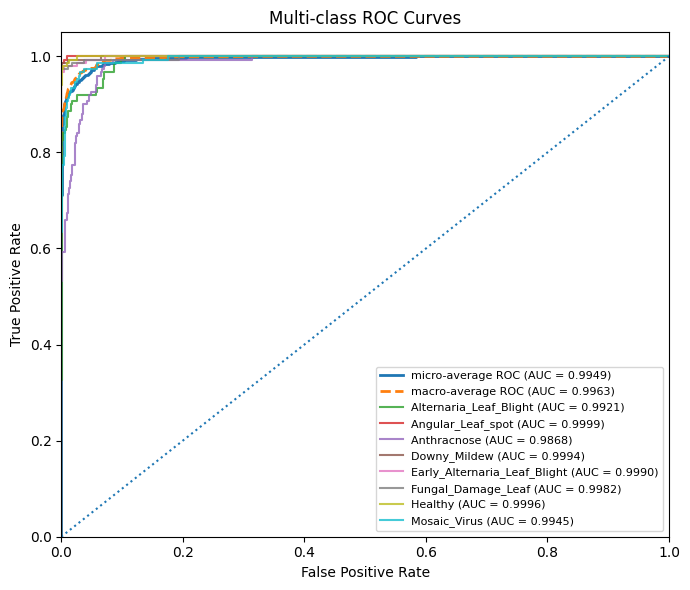

                                 AUC
Angular_Leaf_spot             0.9999
Healthy                       0.9996
Downy_Mildew                  0.9994
Early_Alternaria_Leaf_Blight  0.9990
Fungal_Damage_Leaf            0.9982
macro                         0.9963
micro                         0.9949
Mosaic_Virus                  0.9945
Alternaria_Leaf_Blight        0.9921
Anthracnose                   0.9868


In [ ]:
# !pip install scikit-learn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import pandas as pd

# ====== SETTINGS: একই ফরম্যাট সবখানে ======
DECIMALS = 4          # কত ঘর পর্যন্ত দেখাবে
USE_TRUNCATION = True # True হলে 0.999607 -> 0.9996; False হলে স্ট্যান্ডার্ড রাউন্ড

def fmt(x):
    if USE_TRUNCATION:
        f = 10**DECIMALS
        x = np.floor(x * f) / f
    return f"{x:.{DECIMALS}f}"

# ====== 1) y_true (one-hot) এবং y_score (probabilities) ======
def collect_from_dataset(ds):
    y_true_list, y_score_list = [], []
    for xb, yb in ds:  # yb one-hot
        preds = model.predict(xb, verbose=0)
        y_true_list.append(yb.numpy())
        y_score_list.append(preds)
    return np.concatenate(y_true_list, 0), np.concatenate(y_score_list, 0)

y_true, y_score = collect_from_dataset(test_ds)
n_classes = y_true.shape[1]

# ====== 2) প্রতি ক্লাস, মাইক্রো, ম্যাক্রো ROC & AUC ======
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# micro
fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# macro
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# ====== 3) নামগুলো (লেবেল অর্ডারের সঙ্গে মিলেই) ======
try:
    names = class_names  # আগের কোডে সেট করা আছে
    assert len(names) == n_classes
except:
    names = [f"Class {i}" for i in range(n_classes)]

# ====== 4) Plot (লেজেন্ডে একই fmt) ======
plt.figure(figsize=(7, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f"micro-average ROC (AUC = {fmt(roc_auc['micro'])})", linewidth=2)
plt.plot(fpr["macro"], tpr["macro"], label=f"macro-average ROC (AUC = {fmt(roc_auc['macro'])})", linestyle="--", linewidth=2)

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"{names[i]} (AUC = {fmt(roc_auc[i])})", alpha=0.8)

plt.plot([0, 1], [0, 1], linestyle=":", linewidth=1.5)
plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("Multi-class ROC Curves")
plt.legend(loc="lower right", fontsize=8)
plt.tight_layout()
plt.show()

# ====== 5) AUC টেবিল (একই fmt) ======
auc_table = {names[i]: fmt(roc_auc[i]) for i in range(n_classes)}
auc_table.update({"micro": fmt(roc_auc["micro"]), "macro": fmt(roc_auc["macro"])})
auc_df = pd.DataFrame.from_dict(auc_table, orient="index", columns=["AUC"]).sort_values("AUC", ascending=False)
print(auc_df)


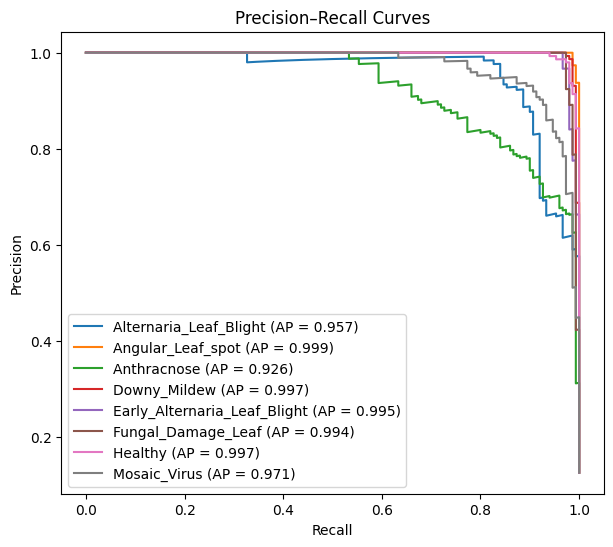

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, pr_auc = {}, {}, {}
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true[:, i], y_score[:, i])
    pr_auc[i] = average_precision_score(y_true[:, i], y_score[:, i])

plt.figure(figsize=(7,6))
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f"{names[i]} (AP = {pr_auc[i]:.3f})")
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title("Precision–Recall Curves")
plt.legend()
plt.show()


In [14]:
!pip install lime

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

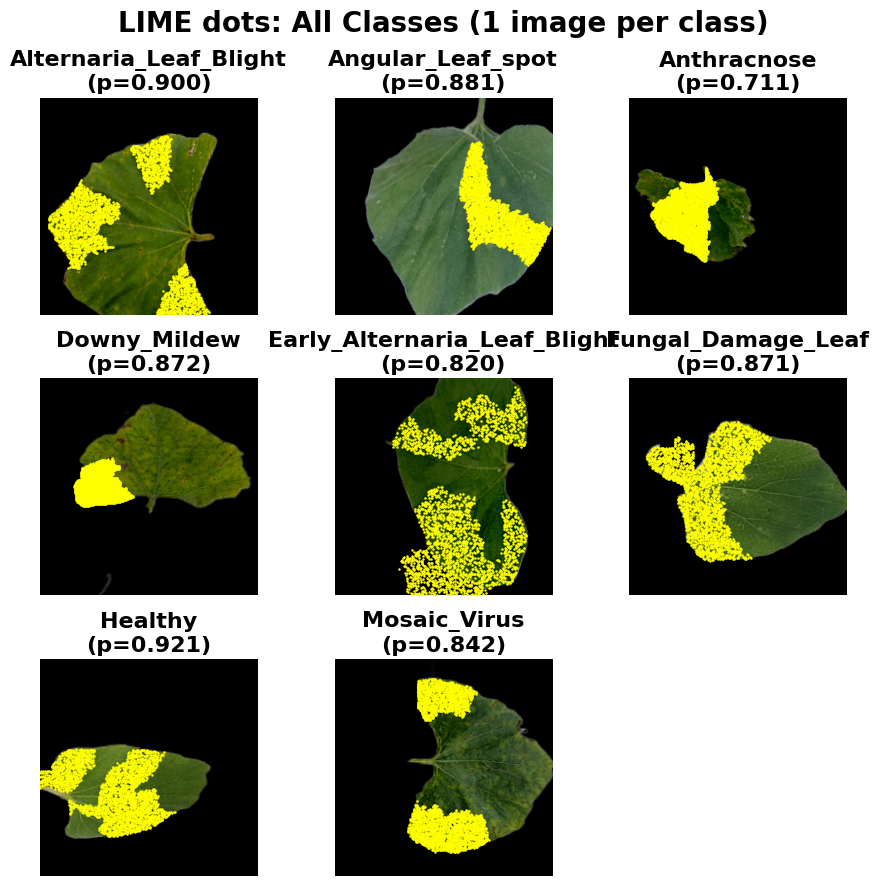

Saved: lime_allclasses_grid.png


In [15]:
# !pip install lime scikit-image
import os, math, numpy as np, matplotlib.pyplot as plt
from lime import lime_image

# ---------- Preprocess helpers ----------
def deprocess_from_mobilenet_v2(x):   # [-1,1] -> [0,1]
    return np.clip((x + 1.0) / 2.0, 0, 1)

def preprocess_for_model_from_01(x):  # [0,1] -> [-1,1]
    return (x * 2.0) - 1.0

def lime_predict(images_01):
    imgs = preprocess_for_model_from_01(images_01.astype(np.float32))
    return model.predict(imgs, verbose=0, batch_size=64)

# ---------- Pick one image per class ----------
def pick_one_index_per_class(X, y_true_int, class_count, strategy="max_conf"):
    preds = model.predict(X, verbose=0, batch_size=64)  # (N, C)
    chosen = [None] * class_count

    for c in range(class_count):
        idxs = np.where(y_true_int == c)[0]
        if len(idxs) == 0:
            continue
        if strategy == "first":
            chosen[c] = idxs[0]
        else:  # max_conf
            best = idxs[np.argmax(preds[idxs, c])]
            chosen[c] = best
    return chosen, preds

# ---------- LIME sparse dots for one image ----------
def lime_dots_sparse_for_image(x_pre, label_to_explain, num_samples=1500,
                               num_features=8, min_weight=0.06,
                               max_points=3500, dot_size=0.5):
    x_vis = deprocess_from_mobilenet_v2(x_pre)  # [0,1]
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        image=x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,  
        num_samples=num_samples,
        batch_size=64
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid, w in seg_weights.items() if w >= min_weight]
    if not keep_ids:
        keep_ids = [sid for sid, w in sorted(seg_weights.items(),
                                             key=lambda t: -abs(t[1]))[:num_features]]

    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))  # (y,x)
    if len(coords) > max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# ---------- Grid for all classes ----------
def grid_all_classes(
    X_test, y_test, class_names,
    strategy="max_conf",
    num_samples=1500, num_features=8, min_weight=0.06,
    max_points=3000, dot_size=0.5,
    save_path="lime_allclasses_grid.png"
):
    y_true_int = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    chosen_idxs_all, preds_all = pick_one_index_per_class(
        X_test, y_true_int, NUM_CLASSES, strategy=strategy
    )

    cols = int(math.ceil(math.sqrt(NUM_CLASSES)))
    rows = int(math.ceil(NUM_CLASSES / cols))

    fig = plt.figure(figsize=(3*cols, 3*rows))
    panel = 1

    for c in range(NUM_CLASSES):
        idx = chosen_idxs_all[c]
        if idx is None or idx >= len(X_test):
            continue

        x_pre = X_test[idx]

        # LIME sparse dots
        x_vis, coords = lime_dots_sparse_for_image(
            x_pre, label_to_explain=c,
            num_samples=num_samples, num_features=num_features,
            min_weight=min_weight, max_points=max_points, dot_size=dot_size
        )

        prob = lime_predict(x_vis[None, ...])[0][c]

        ax = plt.subplot(rows, cols, panel); panel += 1
        ax.imshow(x_vis)
        ax.axis('off')
        if coords.size:
            ax.scatter(coords[:, 1], coords[:, 0], s=dot_size, c='yellow')
        ax.set_title(f"{class_names[c]}\n(p={prob:.3f})", fontsize=16, fontweight='bold')

    plt.suptitle("LIME dots: All Classes (1 image per class)", fontsize=20, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.show()
    print("Saved:", save_path)


# -------- Run it (Hybrid model must be loaded before this) --------
grid_all_classes(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    strategy="max_conf",
    num_samples=1500,
    num_features=8,
    min_weight=0.08,
    max_points=2500,
    dot_size=0.6,
    save_path="lime_allclasses_grid.png"
)


In [16]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# ✅ Define model name manually
model_name = " Hybrid"

# ✅ Callbacks (using correct model name)
checkpoint = ModelCheckpoint(
    f"{model_name}.h5",
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-4
)

# ✅ Train
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,                  # EPOCHS must be integer
    callbacks=[checkpoint, early_stop, reduce_lr]
)



44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9667 - loss: 0.5631

44/44 ━━━━━━━━━━━━━━━━━━━━ 250s 6s/step - accuracy: 0.9720 - loss: 0.5525 - val_accuracy: 0.9251 - val_loss: 0.6789 - learning_rate: 1.0000e-04


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# -----------------------
# 🔹 Denormalize for display
# -----------------------
def denormalize_for_display(img):
    img = img.copy()
    if img.min() < -0.1:  # [-1,1] → 0..1
        img = (img + 1.0) / 2.0
    elif img.max() <= 1.0:
        pass
    else:
        img = img / 255.0
    img = np.clip(img * 255, 0, 255).astype("uint8")
    return img

# -----------------------
# 🔹 CNN Grad-CAM
# -----------------------
def get_cnn_gradcam(model, img_array, last_conv_layer_name="top_conv", pred_index=None):
    # Build a submodel to get last conv output + logits
    grad_model = tf.keras.models.Model(
        model.inputs,
        [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]  # (H,W,C)
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap,0) / (tf.reduce_max(heatmap)+1e-6)
    return heatmap.numpy(), int(pred_index)

# -----------------------
# 🔹 Transformer/ViT Grad-CAM approximation
# -----------------------
def get_vit_gradcam(model, img_array, cls_token_layer_name="get_cls", pred_index=None):
    """
    Approximate ViT Grad-CAM using CLS token gradients only
    """
    cls_layer = model.get_layer(cls_token_layer_name)
    intermediate_model = tf.keras.models.Model(model.inputs, [cls_layer.output, model.output])

    with tf.GradientTape() as tape:
        cls_output, predictions = intermediate_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, cls_output)  # (B, D)
    # take mean across embedding dimension
    heatmap = tf.reduce_mean(grads, axis=-1).numpy()[0]  # scalar
    # reshape to 1x1 then upscale to image size
    heatmap = np.expand_dims(np.expand_dims(heatmap,0),0)
    heatmap = tf.image.resize(heatmap, (img_array.shape[1], img_array.shape[2])).numpy().squeeze()
    heatmap = (heatmap - heatmap.min()) / (heatmap.max()-heatmap.min()+1e-6)
    return heatmap, int(pred_index)

# -----------------------
# 🔹 Full Hybrid Grad-CAM Grid
# -----------------------
def plot_hybrid_gradcam(X_test, y_test, model, class_names, strategy="max_conf", last_conv_layer_name="top_conv"):
    """
    3 columns: Original | CNN Grad-CAM | ViT Grad-CAM
    """
    y_true_int = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    # Pick one image per class
    preds_all = model.predict(X_test, verbose=0, batch_size=32)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int == c)[0]
        if len(idxs) == 0:
            chosen_idxs.append(None)
            continue
        if strategy == "first":
            chosen_idxs.append(idxs[0])
        else:  # max_conf
            best = idxs[np.argmax(preds_all[idxs, c])]
            chosen_idxs.append(best)

    # Grid
    cols = 3
    rows = NUM_CLASSES
    plt.figure(figsize=(cols*4, rows*3))

    for i,c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            continue
        img_array = np.expand_dims(X_test[idx], axis=0)
        orig = denormalize_for_display(X_test[idx])

        # ---- CNN Grad-CAM ----
        cnn_heatmap, _ = get_cnn_gradcam(model, img_array, last_conv_layer_name)
        cnn_heatmap_resized = tf.image.resize(
            np.expand_dims(cnn_heatmap, -1),
            (orig.shape[0], orig.shape[1])
        ).numpy().squeeze()

        # ---- ViT Grad-CAM ----
        vit_heatmap, _ = get_vit_gradcam(model, img_array, cls_token_layer_name="get_cls")
        vit_heatmap_resized = tf.image.resize(
            np.expand_dims(vit_heatmap, -1),
            (orig.shape[0], orig.shape[1])
        ).numpy().squeeze()

        # ---- Plot columns ----
        plt.subplot(rows, cols, i*3 + 1)
        plt.imshow(orig)
        plt.title(f"{class_names[c]}\nOriginal")
        plt.axis("off")

        plt.subplot(rows, cols, i*3 + 2)
        plt.imshow(orig)
        plt.imshow(cnn_heatmap_resized, cmap="jet", alpha=0.5)
        plt.title(f"CNN Grad-CAM\np={preds_all[idx,c]:.3f}")
        plt.axis("off")

        plt.subplot(rows, cols, i*3 + 3)
        plt.imshow(orig)
        plt.imshow(vit_heatmap_resized, cmap="jet", alpha=0.5)
        plt.title(f"ViT Grad-CAM\np={preds_all[idx,c]:.3f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

        


In [20]:
pip install denormalize

Note: you may need to restart the kernel to use updated packages.


In [19]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess function
# -----------------------
def denormalize(img):
    """[-1,1] → 0..255 uint8"""
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 Pseudo Grad-CAM
# -----------------------
def pseudo_gradcam(model, img_array, last_conv_layer_name="top_conv"):
    """
    Approximate Grad-CAM without gradient.
    Uses CNN activations and predicted softmax weight.
    """
    # Get CNN feature map
    backbone_layer = model.get_layer(last_conv_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)  # (1,H,W,C)
    feature_map = feature_map[0].numpy()         # (H,W,C)

    # Get predicted probabilities
    preds = model.predict(img_array, verbose=0)
    class_idx = np.argmax(preds[0])
    pred_prob = preds[0, class_idx]

    # Weight channels by predicted probability
    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 LIME
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Main Dashboard
# -----------------------
def plot_hybrid_pseudocam(X_test, y_test, class_names, last_conv_layer_name="top_conv"):
    """
    X_test: (num_samples, 224,224,3), [-1,1] input
    y_test: (num_samples,) or one-hot
    """
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    # Model predictions
    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(3):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- Pseudo Grad-CAM ----
        heatmap, class_idx, pred_prob = pseudo_gradcam(model, img_array, last_conv_layer_name=last_conv_layer_name)
        heatmap_resized = tf.image.resize(np.expand_dims(heatmap,-1),(orig.shape[0],orig.shape[1])).numpy().squeeze()

        # ---- LIME ----
        x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)

        # ---- Plot Original ----
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal")
        axes[i,0].axis('off')

        # ---- Plot Pseudo Grad-CAM ----
        axes[i,1].imshow(orig)
        axes[i,1].imshow(heatmap_resized, cmap="jet", alpha=0.5)
        axes[i,1].set_title(f"Pseudo Grad-CAM\np={preds_all[idx,c]:.3f}")
        axes[i,1].axis('off')

        # ---- Plot LIME ----
        axes[i,2].imshow(x_vis)
        if coords.size:
            axes[i,2].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,2].set_title("LIME overlay")
        axes[i,2].axis('off')

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

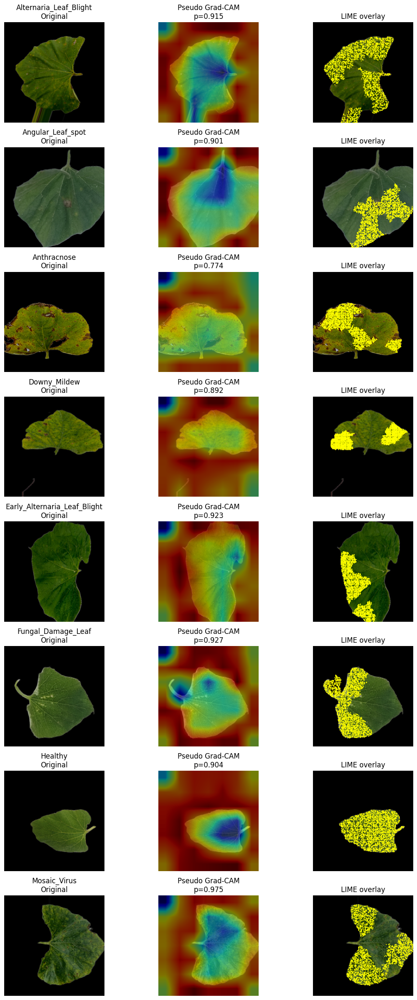

In [21]:
plot_hybrid_pseudocam(
    X_test=X_test, 
    y_test=y_test, 
    class_names=class_names, 
    last_conv_layer_name="conv5_block32_concat"
)


In [22]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess function
# -----------------------
def denormalize(img):
    """[-1,1] → 0..255 uint8"""
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 Pseudo ViT Attention Map
# -----------------------
def pseudo_vit_attention(model, img_array, patch_layer_name="seq_from_high"):
    """
    Approximate ViT attention map using CLS token attention.
    """
    # Extract patch embeddings (sequence) from model
    try:
        patch_layer = model.get_layer(patch_layer_name)
    except:
        raise ValueError(f"Layer '{patch_layer_name}' not found in model!")

    intermediate_model = tf.keras.models.Model(model.input, patch_layer.output)
    seq = intermediate_model(img_array)  # (1, N+1, D)

    # CLS token is first token
    cls_token = seq[:,0:1,:]  # (1,1,D)
    patch_tokens = seq[:,1:,:]  # (1,N,D)

    # Compute simple attention weights (cosine similarity)
    attn_weights = tf.reduce_sum(cls_token * patch_tokens, axis=-1)  # (1,N)
    attn_weights = attn_weights.numpy().squeeze()
    attn_weights = (attn_weights - attn_weights.min())/(attn_weights.max()-attn_weights.min()+1e-6)

    # Reshape to square image approximation
    N = patch_tokens.shape[1]
    size = int(np.sqrt(N))
    attn_map = attn_weights[:size*size].reshape(size, size)
    attn_map = tf.image.resize(np.expand_dims(attn_map,-1),(img_array.shape[1], img_array.shape[2])).numpy().squeeze()
    pred_prob = np.max(model.predict(img_array, verbose=0))
    pred_idx = np.argmax(model.predict(img_array, verbose=0)[0])
    return attn_map, pred_idx, pred_prob

# -----------------------
# 🔹 LIME overlay
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Main ViT plot function
# -----------------------
def plot_vit_attention(X_test, y_test, class_names, patch_layer_name="seq_from_high"):
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(3):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- Pseudo ViT Attention Map ----
        attn_map, class_idx, pred_prob = pseudo_vit_attention(model, img_array, patch_layer_name)
        
        # ---- LIME overlay ----
        x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)

        # ---- Plot Original ----
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal")
        axes[i,0].axis('off')

        # ---- Plot ViT Attention Map ----
        axes[i,1].imshow(orig)
        axes[i,1].imshow(attn_map, cmap="jet", alpha=0.5)
        axes[i,1].set_title(f"ViT Attention\np={preds_all[idx,c]:.3f}")
        axes[i,1].axis('off')

        # ---- Plot LIME overlay ----
        axes[i,2].imshow(x_vis)
        if coords.size:
            axes[i,2].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,2].set_title("LIME overlay")
        axes[i,2].axis('off')

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

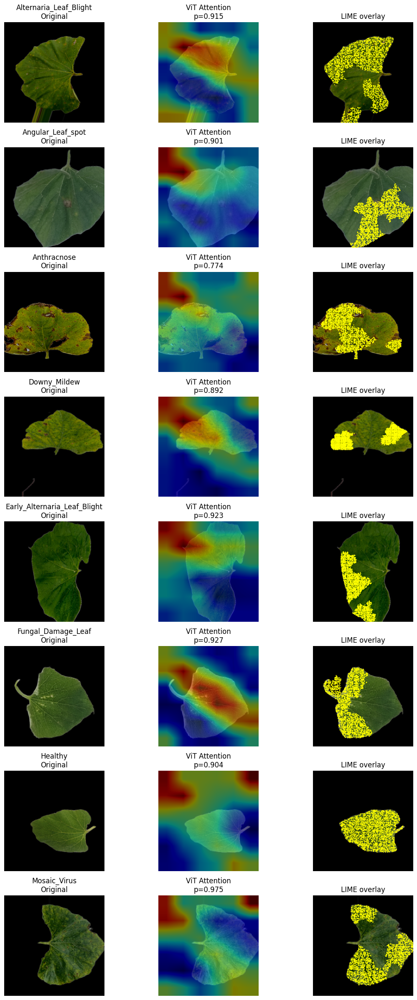

In [23]:
plot_vit_attention(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    patch_layer_name="seq_from_high"  # ViT token layer
)


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess
# -----------------------
def denormalize(img):
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 LIME overlay
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Pseudo Grad-CAM
# -----------------------
def pseudo_gradcam(model, img_array, last_conv_layer_name="top_conv"):
    backbone_layer = model.get_layer(last_conv_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)[0].numpy()  # (H,W,C)

    pred_prob = np.max(model.predict(img_array, verbose=0))
    class_idx = np.argmax(model.predict(img_array, verbose=0)[0])

    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min())/(heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 Pseudo Grad-CAM++
# -----------------------
def pseudo_gradcam_plus(model, img_array, last_conv_layer_name="top_conv"):
    backbone_layer = model.get_layer(last_conv_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)[0].numpy()
    feature_map_sq = feature_map**2

    pred_prob = np.max(model.predict(img_array, verbose=0))
    class_idx = np.argmax(model.predict(img_array, verbose=0)[0])

    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map_sq * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min())/(heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 ViT Attention Map
# -----------------------
def pseudo_vit_attention(model, img_array, patch_layer_name="seq_from_high"):
    patch_layer = model.get_layer(patch_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, patch_layer.output)
    seq = intermediate_model(img_array)
    cls_token = seq[:,0:1,:]
    patch_tokens = seq[:,1:,:]

    attn_weights = tf.reduce_sum(cls_token*patch_tokens, axis=-1).numpy().squeeze()
    attn_weights = (attn_weights - attn_weights.min())/(attn_weights.max()-attn_weights.min()+1e-6)

    N = patch_tokens.shape[1]
    size = int(np.sqrt(N))
    attn_map = attn_weights[:size*size].reshape(size,size)
    attn_map = tf.image.resize(np.expand_dims(attn_map,-1),(img_array.shape[1], img_array.shape[2])).numpy().squeeze()
    pred_prob = np.max(model.predict(img_array, verbose=0))
    class_idx = np.argmax(model.predict(img_array, verbose=0)[0])
    return attn_map, class_idx, pred_prob

# -----------------------
# 🔹 Hybrid Visualization
# -----------------------
def plot_hybrid_visual(X_test, y_test, class_names, last_conv_layer_name="top_conv", patch_layer_name="seq_from_high"):
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)
    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 5, figsize=(18, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(5):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- LIME ----
        x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)

        # ---- Grad-CAM ----
        heatmap1, _, prob1 = pseudo_gradcam(model, img_array, last_conv_layer_name)
        heatmap2, _, prob2 = pseudo_gradcam_plus(model, img_array, last_conv_layer_name)

        # ---- ViT Attention ----
        attn_map, _, prob3 = pseudo_vit_attention(model, img_array, patch_layer_name)

        # ---- Plot Columns ----
        # Original
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal", fontsize=12, fontweight='bold')
        axes[i,0].axis('off')

        # LIME
        axes[i,1].imshow(x_vis)
        if coords.size:
            axes[i,1].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,1].set_title("LIME overlay", fontsize=12, fontweight='bold')
        axes[i,1].axis('off')

        # Grad-CAM
        axes[i,2].imshow(orig)
        axes[i,2].imshow(tf.image.resize(np.expand_dims(heatmap1,-1),(orig.shape[0], orig.shape[1])).numpy().squeeze(), cmap="jet", alpha=0.5)
        axes[i,2].set_title(f"Grad-CAM\np={prob1:.3f}", fontsize=12, fontweight='bold')
        axes[i,2].axis('off')

        # Grad-CAM++
        axes[i,3].imshow(orig)
        axes[i,3].imshow(tf.image.resize(np.expand_dims(heatmap2,-1),(orig.shape[0], orig.shape[1])).numpy().squeeze(), cmap="jet", alpha=0.5)
        axes[i,3].set_title(f"Grad-CAM++\np={prob2:.3f}", fontsize=12, fontweight='bold')
        axes[i,3].axis('off')

        # ViT Attention
        axes[i,4].imshow(orig)
        axes[i,4].imshow(attn_map, cmap="jet", alpha=0.5)
        axes[i,4].set_title(f"ViT Attention\np={prob3:.3f}", fontsize=12, fontweight='bold')
        axes[i,4].axis('off')

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

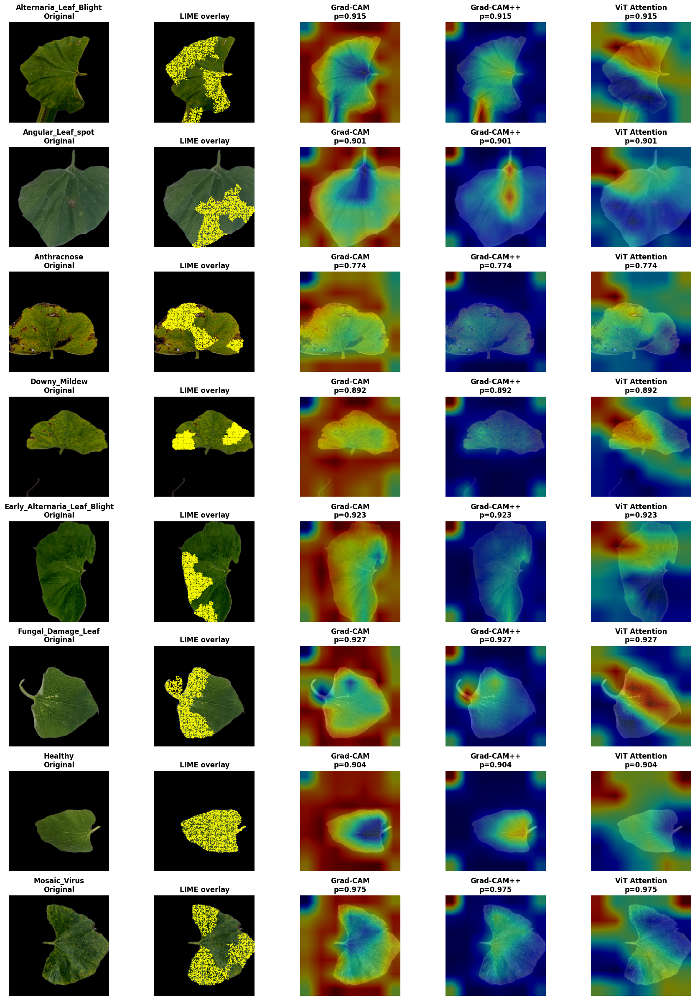

In [26]:
plot_hybrid_visual(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    last_conv_layer_name="conv5_block32_concat",
    patch_layer_name="seq_from_high"
)


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess function
# -----------------------
def denormalize(img):
    """Convert normalized image [-1,1] or [0,1] to uint8 [0,255]"""
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 LIME overlay
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1  # convert [0,1] -> [-1,1]
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Pseudo Grad-CAM
# -----------------------
def pseudo_gradcam(model, img_array, last_conv_layer_name="top_conv"):
    backbone_layer = model.get_layer(last_conv_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)[0].numpy()  # (H,W,C)

    pred_prob = np.max(model.predict(img_array, verbose=0))
    class_idx = np.argmax(model.predict(img_array, verbose=0)[0])

    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min())/(heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 Pseudo Grad-CAM++
# -----------------------
def pseudo_gradcam_plus(model, img_array, last_conv_layer_name="top_conv"):
    backbone_layer = model.get_layer(last_conv_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)[0].numpy()
    feature_map_sq = feature_map**2

    pred_prob = np.max(model.predict(img_array, verbose=0))
    class_idx = np.argmax(model.predict(img_array, verbose=0)[0])

    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map_sq * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min())/(heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 ViT Attention Map
# -----------------------
def pseudo_vit_attention(model, img_array, patch_layer_name="seq_from_high"):
    patch_layer = model.get_layer(patch_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, patch_layer.output)
    seq = intermediate_model(img_array)
    cls_token = seq[:,0:1,:]
    patch_tokens = seq[:,1:,:]

    attn_weights = tf.reduce_sum(cls_token*patch_tokens, axis=-1).numpy().squeeze()
    attn_weights = (attn_weights - attn_weights.min())/(attn_weights.max()-attn_weights.min()+1e-6)

    N = patch_tokens.shape[1]
    size = int(np.sqrt(N))
    attn_map = attn_weights[:size*size].reshape(size,size)
    attn_map = tf.image.resize(np.expand_dims(attn_map,-1),(img_array.shape[1], img_array.shape[2])).numpy().squeeze()
    pred_prob = np.max(model.predict(img_array, verbose=0))
    class_idx = np.argmax(model.predict(img_array, verbose=0)[0])
    return attn_map, class_idx, pred_prob

# -----------------------
# 🔹 Hybrid Visualization
# -----------------------
def plot_hybrid_visual(X_test, y_test, class_names, last_conv_layer_name="top_conv", patch_layer_name="seq_from_high", fontsize=12):
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)
    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 5, figsize=(18, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(5):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- LIME ----
        x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)
        lime_pred = lime_predict(np.expand_dims(X_test[idx],0))[0,c]

        # ---- Grad-CAM ----
        heatmap1, _, prob1 = pseudo_gradcam(model, img_array, last_conv_layer_name)
        heatmap2, _, prob2 = pseudo_gradcam_plus(model, img_array, last_conv_layer_name)

        # ---- ViT Attention ----
        attn_map, _, prob3 = pseudo_vit_attention(model, img_array, patch_layer_name)

        # ---- Plot Columns ----
        # Original
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal", fontsize=16)
        axes[i,0].axis('off')

        # LIME
        axes[i,1].imshow(x_vis)
        if coords.size:
            axes[i,1].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,1].set_title(f"LIME overlay\np={lime_pred:.3f}", fontsize=16)
        axes[i,1].axis('off')

        # Grad-CAM
        axes[i,2].imshow(orig)
        axes[i,2].imshow(tf.image.resize(np.expand_dims(heatmap1,-1),(orig.shape[0], orig.shape[1])).numpy().squeeze(), cmap="jet", alpha=0.5)
        axes[i,2].set_title(f"Grad-CAM\np={prob1:.3f}", fontsize=16)
        axes[i,2].axis('off')

        # Grad-CAM++
        axes[i,3].imshow(orig)
        axes[i,3].imshow(tf.image.resize(np.expand_dims(heatmap2,-1),(orig.shape[0], orig.shape[1])).numpy().squeeze(), cmap="jet", alpha=0.5)
        axes[i,3].set_title(f"Grad-CAM++\np={prob2:.3f}", fontsize=16)
        axes[i,3].axis('off')

        # ViT Attention
        axes[i,4].imshow(orig)
        axes[i,4].imshow(attn_map, cmap="jet", alpha=0.5)
        axes[i,4].set_title(f"ViT Attention\np={prob3:.3f}", fontsize=16)
        axes[i,4].axis('off')

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

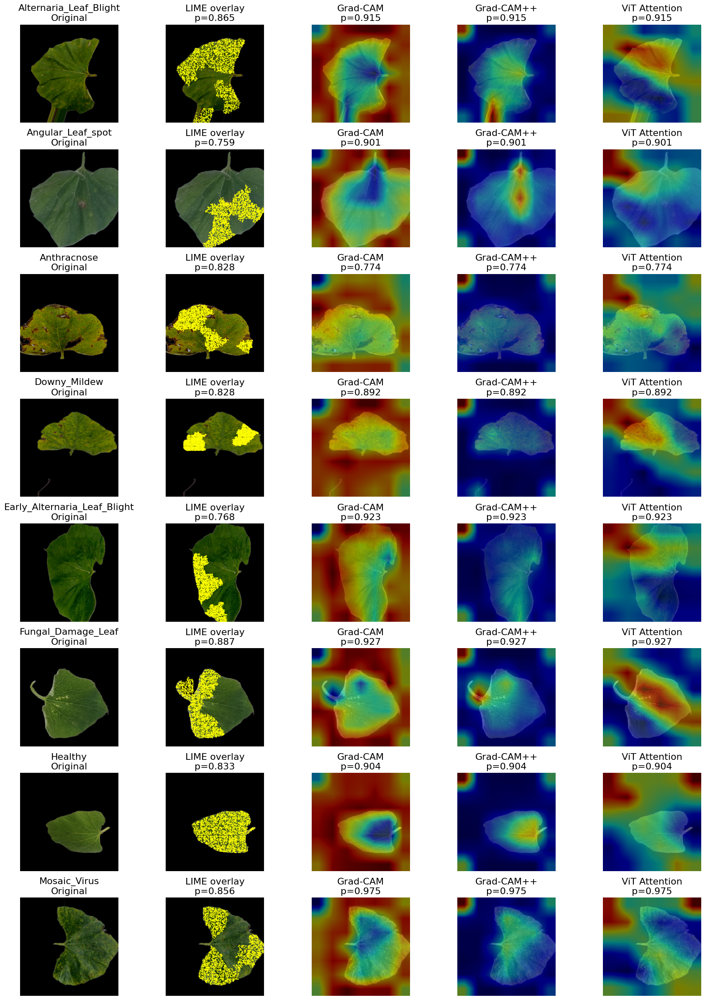

In [28]:
plot_hybrid_visual(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    last_conv_layer_name="conv5_block32_concat",
    patch_layer_name="seq_from_high"
)


In [29]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import tensorflow as tf
from sklearn.metrics import classification_report

# -------------------------------
# 🔹 Occlusion Sensitivity Map
# -------------------------------
def occlusion_sensitivity_map(
    model,
    img_path_or_array,
    preprocess_fn=preprocess_input,
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,           
    target_class=None,
    batch_size=32,
    normalize=True
):
    """
    Compute occlusion sensitivity map for a single image.
    Returns dict with:
      - heatmap (H,W) normalized 0..1
      - original prediction probabilities (preds_orig)
      - target_class index
      - orig_prob for target_class
      - top_preds: all (class_idx, prob)
      - image_uint8 (for plotting)
    """

    # Load image if path given
    if isinstance(img_path_or_array, str):
        img = load_img(img_path_or_array, target_size=input_size)
        img = img_to_array(img).astype(np.float32)
    else:
        img = img_path_or_array.copy().astype(np.float32)
        if tuple(img.shape[:2]) != tuple(input_size):
            img = tf.image.resize(img, input_size).numpy()

    img_uint8 = np.clip(img, 0, 255).astype(np.uint8)
    x_orig = preprocess_fn(img.copy())
    x_orig = np.expand_dims(x_orig, axis=0)

    preds_orig = model.predict(x_orig, verbose=0)[0]
    if target_class is None:
        target_class = int(np.argmax(preds_orig))
    orig_prob = float(preds_orig[target_class])

    H, W = input_size
    heatmap = np.zeros((H, W), dtype=np.float32)
    counts  = np.zeros((H, W), dtype=np.float32)

    # Baseline patch
    if baseline is None:
        base_patch = np.zeros((patch_size, patch_size, 3), dtype=np.float32)
    else:
        bp = np.array(baseline, dtype=np.float32)
        if bp.shape == ():  
            base_patch = np.ones((patch_size, patch_size, 3), dtype=np.float32) * bp
        elif bp.shape == (3,):
            base_patch = np.ones((patch_size, patch_size, 3), dtype=np.float32) * bp.reshape((1,1,3))
        else:
            raise ValueError("baseline must be None, scalar, or shape-(3,)")

    ys = list(range(0, H - patch_size + 1, stride))
    xs = list(range(0, W - patch_size + 1, stride))
    if ys[-1] != H - patch_size: ys.append(H - patch_size)
    if xs[-1] != W - patch_size: xs.append(W - patch_size)

    occluded_images = []
    occluded_positions = []

    for y in ys:
        for x in xs:
            im = img.copy()
            im[y:y+patch_size, x:x+patch_size, :] = base_patch
            occluded_images.append(im)
            occluded_positions.append((y, x))

            if len(occluded_images) >= batch_size:
                batch = np.array([preprocess_fn(i.copy()) for i in occluded_images])
                preds = model.predict(batch, verbose=0)
                for i, p in enumerate(preds):
                    prob = float(p[target_class])
                    drop = orig_prob - prob
                    yy, xx = occluded_positions[i]
                    heatmap[yy:yy+patch_size, xx:xx+patch_size] += drop
                    counts[yy:yy+patch_size, xx:xx+patch_size] += 1.0
                occluded_images, occluded_positions = [], []

    if occluded_images:
        batch = np.array([preprocess_fn(i.copy()) for i in occluded_images])
        preds = model.predict(batch, verbose=0)
        for i, p in enumerate(preds):
            prob = float(p[target_class])
            drop = orig_prob - prob
            yy, xx = occluded_positions[i]
            heatmap[yy:yy+patch_size, xx:xx+patch_size] += drop
            counts[yy:yy+patch_size, xx:xx+patch_size] += 1.0

    counts[counts == 0] = 1.0
    heatmap = heatmap / counts
    if normalize:
        hm_min, hm_max = heatmap.min(), heatmap.max()
        heatmap = (heatmap - hm_min) / (hm_max - hm_min + 1e-6)

    # Top predictions: ALL classes
    sorted_idx = np.argsort(preds_orig)[::-1]
    top_preds = [(int(i), float(preds_orig[i])) for i in sorted_idx]

    return {
        "heatmap": heatmap,
        "orig_prob": orig_prob,
        "target_class": target_class,
        "preds_orig": preds_orig,
        "top_preds": top_preds,
        "image_uint8": img_uint8
    }

# -------------------------------
# 🔹 Plot occlusion map + predictions
# -------------------------------
def plot_occlusion_map(result, class_names=None, cmap="jet", alpha=0.5, figsize=(8,8), fontsize=20):
    heatmap = result["heatmap"]
    img = result["image_uint8"]
    target_class = result["target_class"]
    orig_prob = result["orig_prob"]
    top_preds = result["top_preds"]

    title_class = class_names[target_class] if class_names and target_class < len(class_names) else f"Class {target_class}"

    plt.figure(figsize=(figsize[0]*2, figsize[1]))
    plt.subplot(1,2,1)
    plt.imshow(img.astype(np.uint8))
    plt.title(f"Original - {title_class}\nPred prob: {orig_prob:.3f}", fontsize=20)
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(img.astype(np.uint8))
    plt.imshow(heatmap, cmap=cmap, alpha=alpha)
    plt.title("Occlusion Sensitivity", fontsize=fontsize)
    plt.axis("off")
    plt.show()

    print("🔹 Prediction Scores (all classes):")
    for idx, prob in top_preds:
        cname = class_names[idx] if class_names and idx < len(class_names) else f"Class {idx}"
        marker = "✅" if idx == target_class else "  "
        print(f"{marker} {cname:<25s}: {prob:.4f}")

    plt.figure(figsize=(6,5))
    plt.imshow(heatmap, cmap=cmap)
    plt.title("Heatmap (Normalized)", fontsize=20)
    plt.colorbar()
    plt.axis("off")
    plt.show()

# -------------------------------
# 🔹 Dataset classification report
# -------------------------------
def dataset_classification_report(model, X_test, y_test, class_names=None, preprocess_fn=preprocess_input, batch_size=32):
    X_proc = np.array([preprocess_fn(x) for x in X_test])
    y_pred_probs = model.predict(X_proc, batch_size=batch_size, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    print("===== Classification Report =====")
    print(classification_report(y_true, y_pred, target_names=class_names))


In [30]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Citruspot/aug_pil_0_b1.17_c0.76_col0.95 (Custom).jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


FileNotFoundError: [Errno 2] No such file or directory: '/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Citruspot/aug_pil_0_b1.17_c0.76_col0.95 (Custom).jpg'

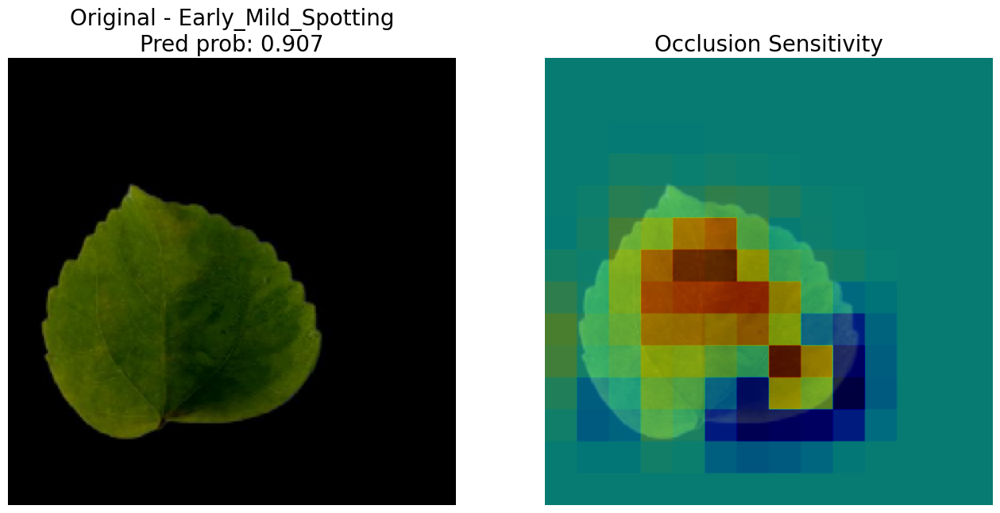

🔹 Prediction Scores (all classes):
✅ Early_Mild_Spotting      : 0.9070
   Wrinkled_Leaf            : 0.0163
   Mild_Edge_Damage         : 0.0143
   Fungal_Infected          : 0.0134
   Citruspot                : 0.0133
   Senescent                : 0.0123
   Slightly_Diseased        : 0.0122
   Healthy                  : 0.0111


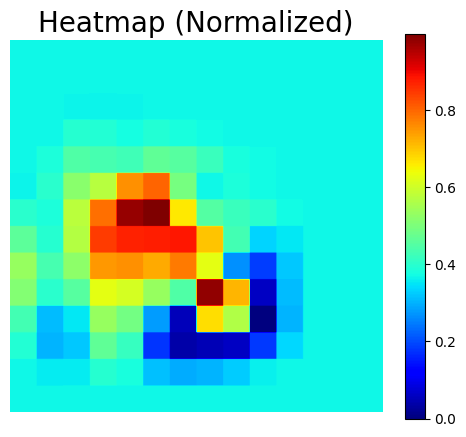

In [48]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Early_Mild_Spotting/aug_pil_0_b0.86_c1.06_col1.20.jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


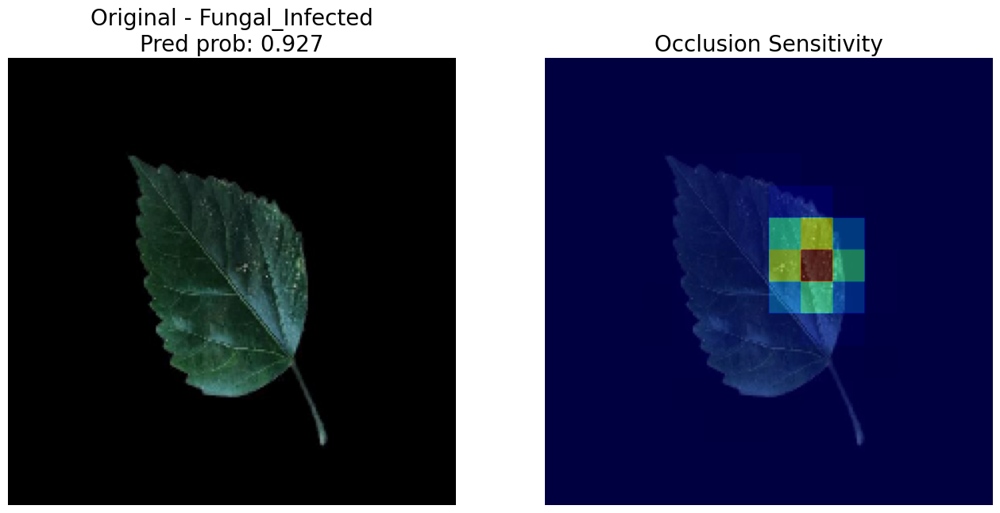

🔹 Prediction Scores (all classes):
✅ Fungal_Infected          : 0.9273
   Mild_Edge_Damage         : 0.0134
   Healthy                  : 0.0110
   Citruspot                : 0.0103
   Early_Mild_Spotting      : 0.0101
   Wrinkled_Leaf            : 0.0096
   Senescent                : 0.0093
   Slightly_Diseased        : 0.0090


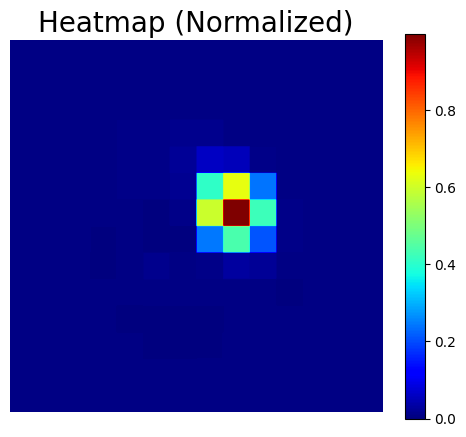

In [49]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Fungal_Infected/aug_pil_0_b1.17_c0.97_col0.75.jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


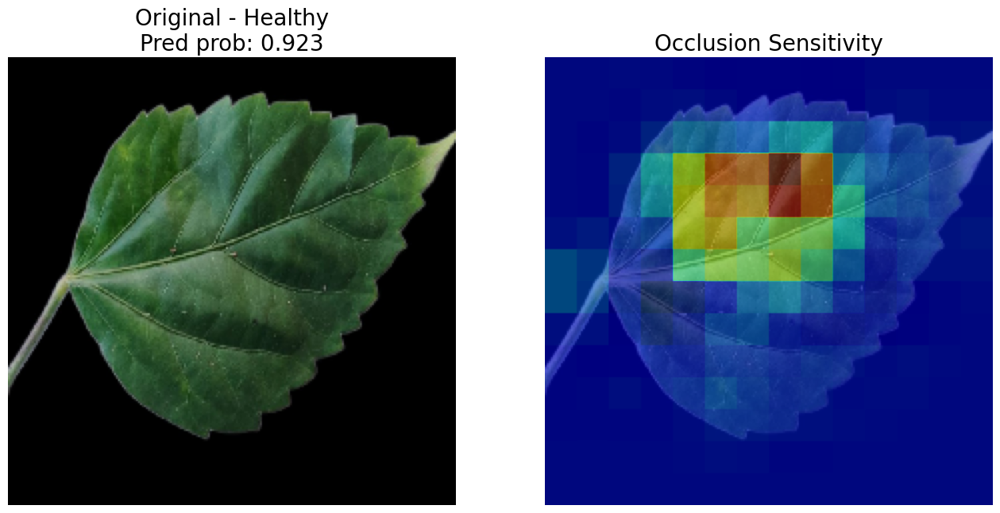

🔹 Prediction Scores (all classes):
✅ Healthy                  : 0.9226
   Mild_Edge_Damage         : 0.0127
   Senescent                : 0.0115
   Slightly_Diseased        : 0.0112
   Wrinkled_Leaf            : 0.0111
   Fungal_Infected          : 0.0111
   Citruspot                : 0.0101
   Early_Mild_Spotting      : 0.0097


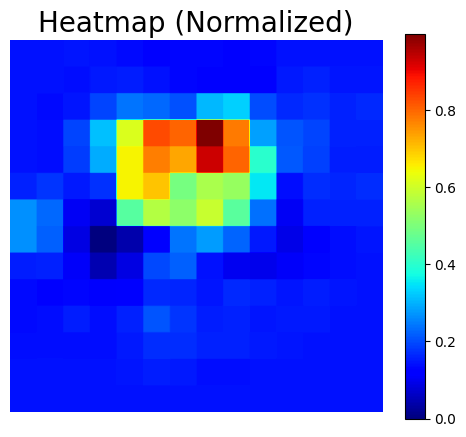

In [50]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Healthy/Healthy_499.jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


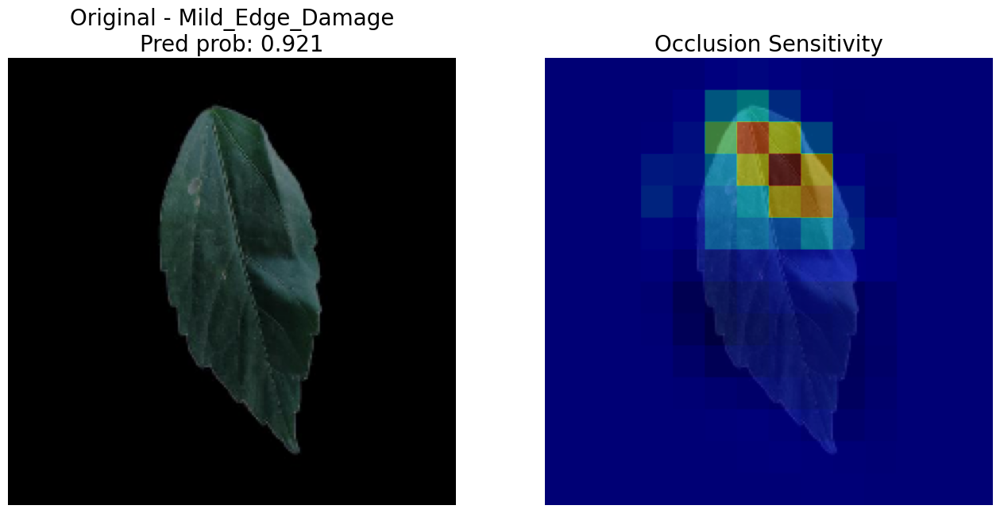

🔹 Prediction Scores (all classes):
✅ Mild_Edge_Damage         : 0.9210
   Fungal_Infected          : 0.0191
   Citruspot                : 0.0115
   Early_Mild_Spotting      : 0.0110
   Slightly_Diseased        : 0.0100
   Healthy                  : 0.0100
   Senescent                : 0.0088
   Wrinkled_Leaf            : 0.0085


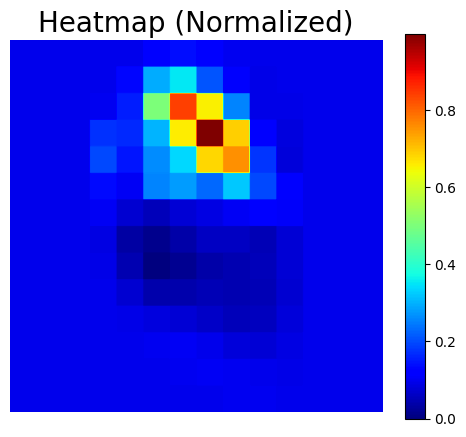

In [51]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Mild_Edge_Damage/aug_pil_0_b0.78_c0.93_col0.74.jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


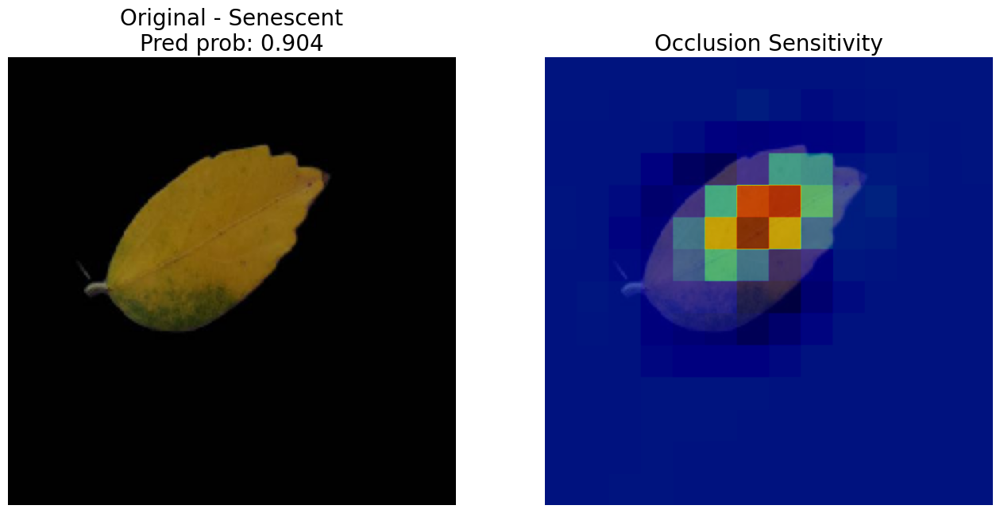

🔹 Prediction Scores (all classes):
✅ Senescent                : 0.9043
   Mild_Edge_Damage         : 0.0155
   Early_Mild_Spotting      : 0.0141
   Healthy                  : 0.0141
   Citruspot                : 0.0132
   Slightly_Diseased        : 0.0130
   Fungal_Infected          : 0.0129
   Wrinkled_Leaf            : 0.0128


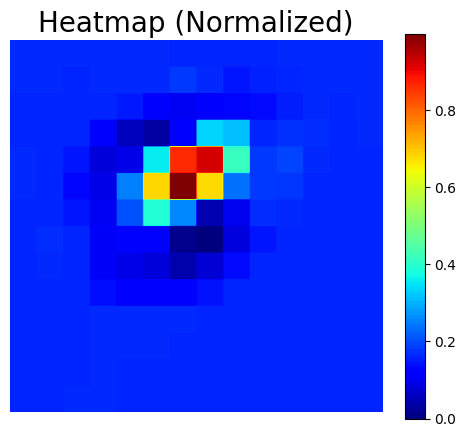

In [52]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Senescent/aug_pil_0_b0.91_c0.87_col0.99.jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


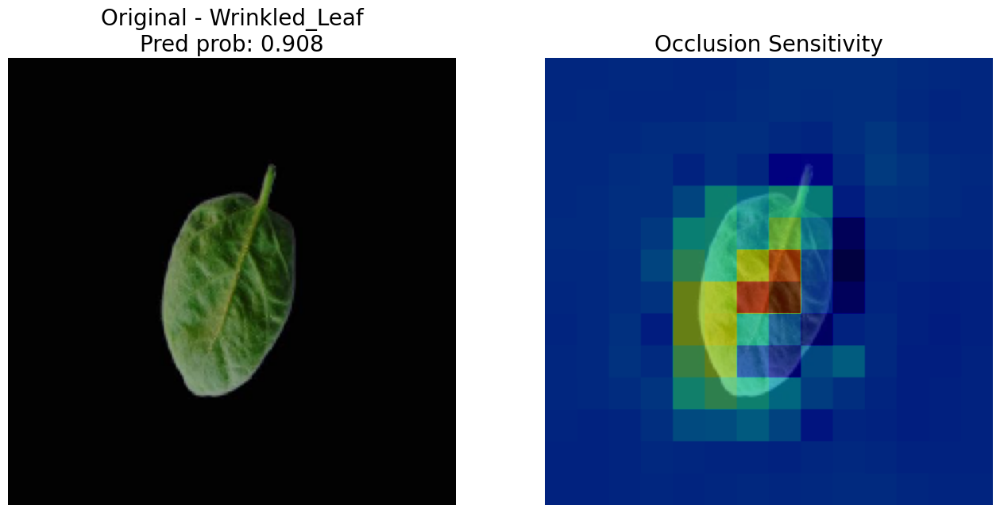

🔹 Prediction Scores (all classes):
✅ Wrinkled_Leaf            : 0.9082
   Citruspot                : 0.0134
   Slightly_Diseased        : 0.0133
   Mild_Edge_Damage         : 0.0132
   Healthy                  : 0.0131
   Early_Mild_Spotting      : 0.0130
   Fungal_Infected          : 0.0129
   Senescent                : 0.0129


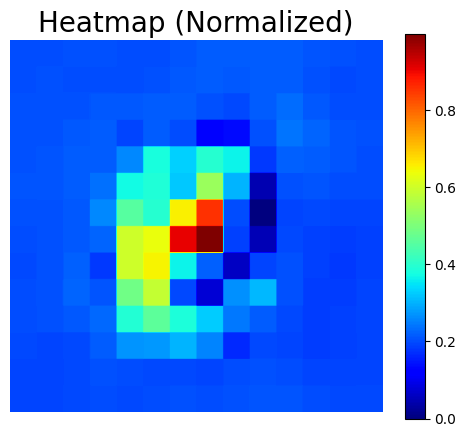

In [53]:
# Define your dataset class names (example for 8 classes)
class_names = [
    "Citruspot",
    "Early_Mild_Spotting",
    "Fungal_Infected",
    "Healthy",
    "Mild_Edge_Damage",
    "Senescent",  
    "Slightly_Diseased",
     "Wrinkled_Leaf",
    
]

# Set image path
img_path = "/teamspace/studios/this_studio/Hibiscus and Tea  combined Dataset/Wrinkled_Leaf/aug_pil_0_b1.09_c0.78_col1.25.jpg"

# Compute occlusion sensitivity map
res = occlusion_sensitivity_map(
    model,
    img_path,
    preprocess_fn=preprocess_input,   # matches your training preprocess
    input_size=(224,224),
    patch_size=32,
    stride=16,
    baseline=None,      # or baseline=(123.68, 116.779, 103.939) for imagenet mean
    target_class=None,  # None => use predicted class
    batch_size=32
)

# Plot with class names
plot_occlusion_map(res, class_names=class_names)


In [54]:
import matplotlib.pyplot as plt
import numpy as np

def plot_advanced_occlusion(result, class_names=None, cmap="jet", alpha=0.5, figsize=(18,6), fontsize=14):
    """
    Advanced visualization:
    - Original image
    - Occlusion sensitivity heatmap overlay
    - Bar chart with all class probabilities
    """
    img = result["image_uint8"]
    heatmap = result["heatmap"]
    top_preds = result["top_preds"]

    # Extract predictions and class labels
    probs = np.array([p for _, p in top_preds])
    labels = [class_names[i] if class_names else f"Class {i}" for i, _ in top_preds]
    target_class = result["target_class"]

    fig, axes = plt.subplots(1, 3, figsize=figsize)

    # Original Image
    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title("Original Image", fontsize=fontsize)
    axes[0].axis("off")

    # Heatmap overlay
    axes[1].imshow(img.astype(np.uint8))
    axes[1].imshow(heatmap, cmap=cmap, alpha=alpha)
    axes[1].set_title("Occlusion Sensitivity Overlay", fontsize=fontsize)
    axes[1].axis("off")

    # Bar chart of all class probabilities
    bars = axes[2].bar(labels, probs, color='skyblue')
    bars[target_class].set_color('orange')  # highlight predicted class
    axes[2].set_title("All Class Probabilities", fontsize=fontsize)
    axes[2].set_ylim([0, 1])
    axes[2].set_ylabel("Probability", fontsize=fontsize)
    axes[2].tick_params(axis='x', rotation=45, labelsize=fontsize-2)
    axes[2].tick_params(axis='y', labelsize=fontsize-2)

    # Show probability values on top of bars
    for bar, prob in zip(bars, probs):
        axes[2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                     f"{prob:.2f}", ha='center', fontsize=fontsize-2)

    plt.tight_layout()
    plt.show()


In [55]:
# Example: assuming you already have outputs from your functions
x_img = X_test[0].copy()  # original image array
lime_vis, lime_coords = lime_dots_sparse(x_img, label_to_explain=target_class)
gradcam_map, _, _ = pseudo_gradcam(model, np.expand_dims(x_img,0))
gradcam_plus_map, _, _ = pseudo_gradcam_plus(model, np.expand_dims(x_img,0))
vit_map, _, _ = pseudo_vit_attention(model, np.expand_dims(x_img,0))
occ_result = occlusion_sensitivity_map(model, x_img)
occlusion_map = occ_result["heatmap"]

plot_full_explainability(
    model=model,
    img_array=x_img,
    class_names=class_names,
    lime_coords=lime_coords,
    gradcam_map=gradcam_map,
    gradcam_plus_map=gradcam_plus_map,
    vit_attn_map=vit_map,
    occlusion_map=occlusion_map
)


NameError: name 'target_class' is not defined